In [1]:
import numpy as np
import pandas as pd
from scipy.linalg import expm, null_space, solve
from scipy.sparse.linalg import expm_multiply
import matplotlib.pyplot as plt
import networkx as nx

from qlinks.lattice.square_lattice import SquareLattice
from qlinks.symmetry.gauss_law import GaussLaw
from qlinks.computation_basis import ComputationBasis
from qlinks.solver.deep_first_search import DeepFirstSearch
from qlinks.model import QuantumLinkModel
from qlinks.visualizer.graph import GraphVisualizer

In [2]:
def format_custom_index(index):
    return [f"({i}) {idx}" for i, idx in enumerate(index)]

In [3]:
def setup_model(lattice_shape, n_solution, coup_j, coup_rk):
    gauss_law = GaussLaw.from_staggered_charge_distri(*lattice_shape)
    gauss_law.flux_sector = (0, 0)
    dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
    basis = gauss_law.to_basis(dfs.solve(n_solution))
    model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
    return basis, model

# Lattice 4x2

In [72]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(4, 2), n_solution=16, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-09 12:21:35 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-09 12:21:35 [deep_first_search.py] INFO: Found 16 Solutions as required in 103 steps.


In [73]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
(0) 17595,0,1,0,0,0,1,0,0,1,0,1,1,1,0,1,1
(1) 18867,0,1,0,0,1,0,0,1,1,0,1,1,0,0,1,1
(2) 19638,0,1,0,0,1,1,0,0,1,0,1,1,0,1,1,0
(3) 36135,1,0,0,0,1,1,0,1,0,0,1,0,0,1,1,1
(4) 37947,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1
(5) 39219,1,0,0,1,1,0,0,1,0,0,1,1,0,0,1,1
(6) 39990,1,0,0,1,1,1,0,0,0,0,1,1,0,1,1,0
(7) 44307,1,0,1,0,1,1,0,1,0,0,0,1,0,0,1,1
(8) 50283,1,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1
(9) 51555,1,1,0,0,1,0,0,1,0,1,1,0,0,0,1,1


In [74]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
7,3.0,3.451266e-31,3.0
8,3.0,0.000000e+00,3.0
9,3.0,1.577722e-30,3.0


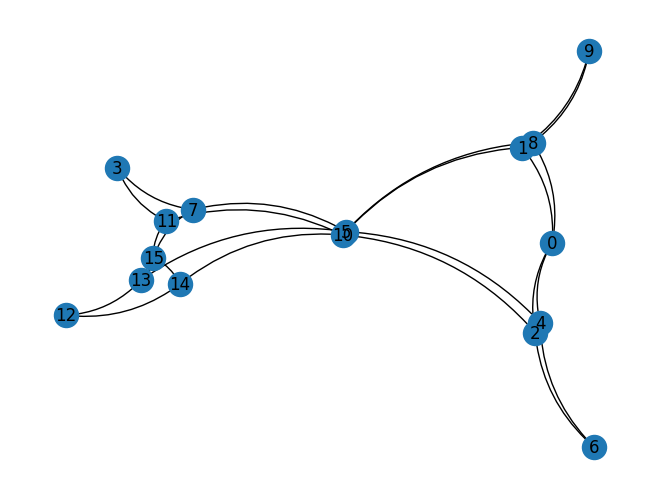

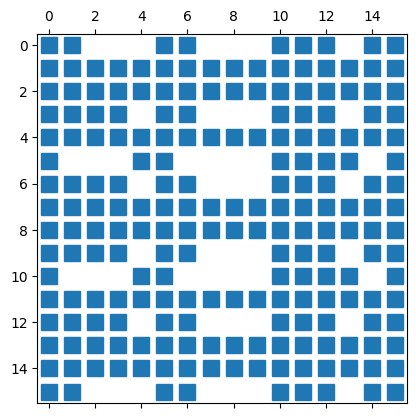

In [75]:
# plt.matshow(model.kinetic_term)
# plt.colorbar()
# plt.show()

g = nx.from_numpy_array(-model.kinetic_term)
assert nx.is_bipartite(g)
left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align="horizontal")
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.05, 2) for k, v in pos.items()}
nx.draw(g, pos, with_labels=True, arrows=True, connectionstyle="arc3,rad=0.2")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=12)
plt.show()

# plt.imshow(np.abs(evecs), interpolation='none', cmap='binary')
# plt.colorbar()
# plt.show()

In [ ]:
lap_mat = nx.laplacian_matrix(g).todense()
lap_evals, lap_evecs = np.linalg.eigh(lap_mat)
plt.matshow(lap_evecs)
plt.colorbar()

In [78]:
entropies = np.asarray([model.entropy(evecs[:, i], 1, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df

0     1.536650
1     1.899841
2     0.695771
3     1.562885
4     1.528069
5     1.600664
6     1.932517
7     1.525501
8     1.611432
9     1.481633
10    1.941802
11    0.973698
12    1.147446
13    1.309708
14    1.502661
15    1.501048
Name: entropy, dtype: float64

<Axes: >

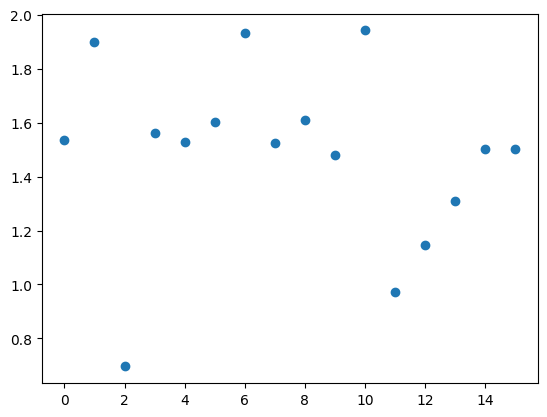

In [79]:
entropy_df.plot(style='o')

array([ 1,  2,  4,  7,  8, 11, 13, 14])

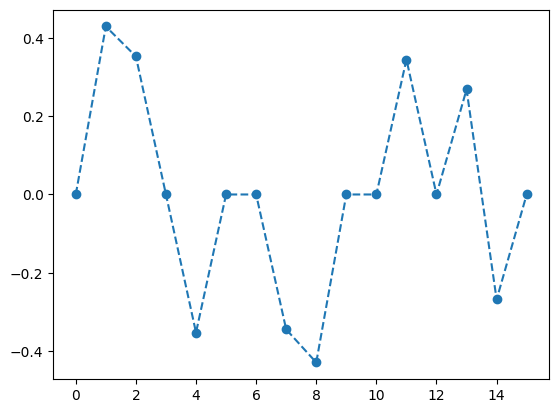

In [81]:
plt.plot(evecs[:, 8], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 8]) > 0.2)[0]

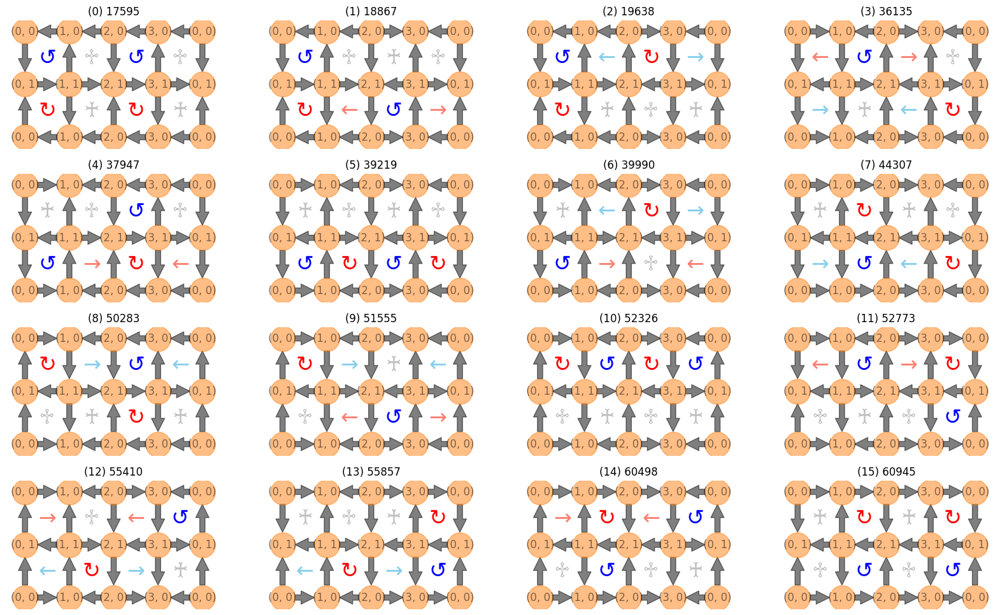

In [37]:
fig, axes = plt.subplots(4, 4, figsize=(20, 12), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

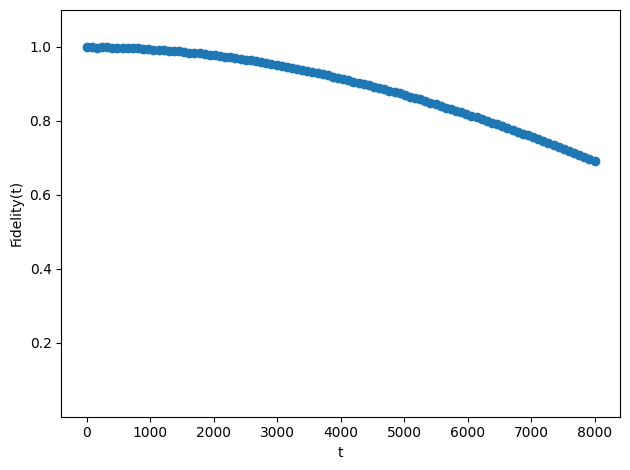

final fidelity = 0.6918527791860878
O_kin @ psi_scar = [-0.00809208-0.01542537j  0.0014847 -0.00168695j -0.00405283+0.00038009j
 -0.00015538+0.00763505j -0.00148649-0.00084652j -0.0046398 +0.00156666j
 -0.00208771-0.00776528j  0.00108227+0.00019704j -0.00108165-0.00046034j
 -0.00600437-0.00766009j -0.00376304-0.00172192j -0.00148408+0.00142365j
 -0.00015538+0.00763505j  0.00108227+0.00019704j -0.00148408+0.00142365j
 -0.00031076+0.01527011j]
<O_kin> = (3.376562969898886e-05-5.6669523138640625e-05j)
<O_pot> = (-1.103455166699037+0.38140572068114603j)
<H> = (-1.103421401069338+0.38134905115800743j)


In [47]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.0125
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([1, 2, 4, 8]), 0] = np.array([1, 1, -1, -1])
scar_state /= np.linalg.norm(scar_state)

evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=0, stop=8000, num=100)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]

plt.plot(np.linspace(0, 8000, 100), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 4x4

In [82]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(4, 4), n_solution=132, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-09 12:28:04 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-09 12:28:04 [deep_first_search.py] INFO: Found 132 Solutions as required in 1626 steps.


In [83]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
(0) 1142025915,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(1) 1143328443,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(2) 1146285243,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(3) 1147587771,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(4) 1147913403,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(127) 3998411793,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(128) 3999714321,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(129) 4000039953,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(130) 4004924433,1,1,1,0,1,1,1,0,1,0,...,0,0,0,0,0,1,0,0,0,1


In [84]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df[evecs_df["kin"].abs() < 1e-12]

,eval,kin,pot
47,4.0,-9.907176e-30,4.0
48,4.0,-8.923989e-30,4.0
49,4.0,-9.959369e-30,4.0
50,4.0,-6.914859e-30,4.0
51,4.0,-5.756219e-30,4.0
52,4.0,3.056836e-30,4.0
53,4.0,-2.465190e-30,4.0
54,4.0,-1.015658e-29,4.0
55,4.0,-1.005798e-29,4.0


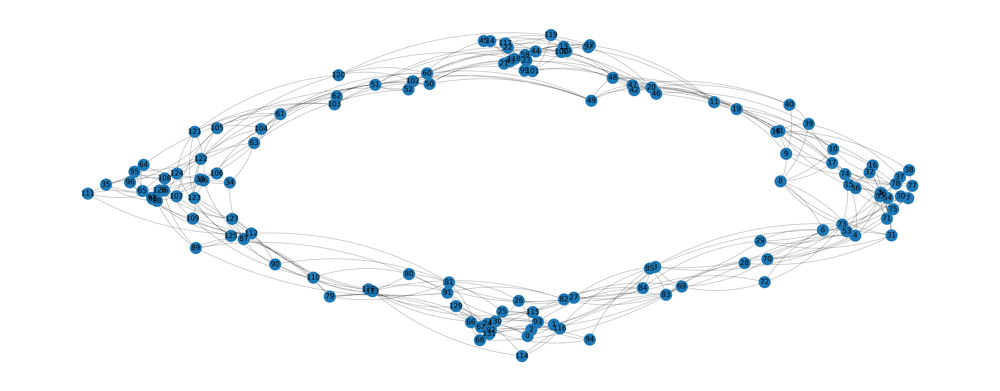

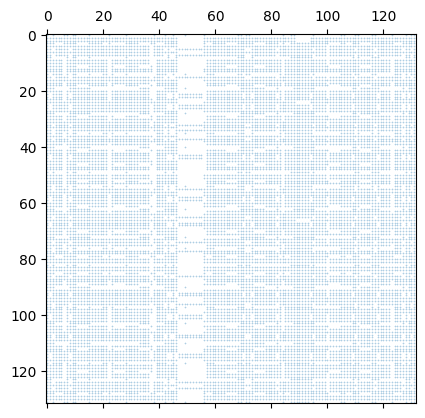

In [52]:
# plt.matshow(ham)
# plt.colorbar()
# plt.show()

g = nx.from_numpy_array(-model.kinetic_term)
left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.08, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.1)
plt.show()

# plt.imshow(np.abs(evecs), interpolation='none', cmap='binary')
# plt.colorbar()
# plt.show()

102


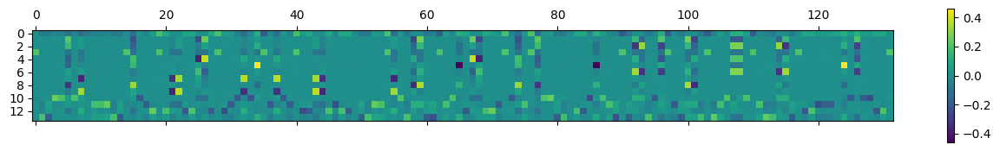

In [53]:
print(np.linalg.matrix_rank(model.kinetic_term))

plt.matshow(evecs[:, 46:60].T)
plt.colorbar()

In [54]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 1.75]

51    1.239624
53    1.603249
55    1.675178
Name: entropy, dtype: float64

<Axes: >

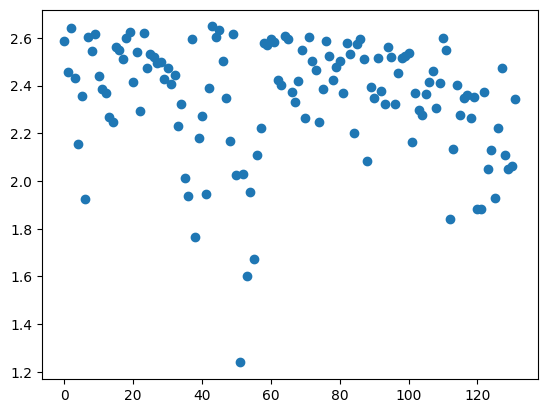

In [55]:
entropy_df.plot(style='o')

array([ 34,  65,  86, 124])

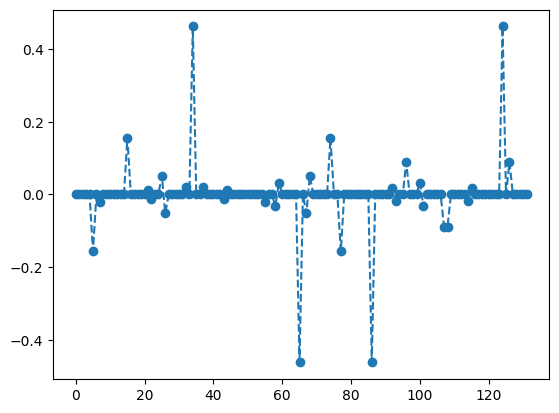

In [56]:
plt.plot(evecs[:, 51], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 51]) > 0.2)[0]

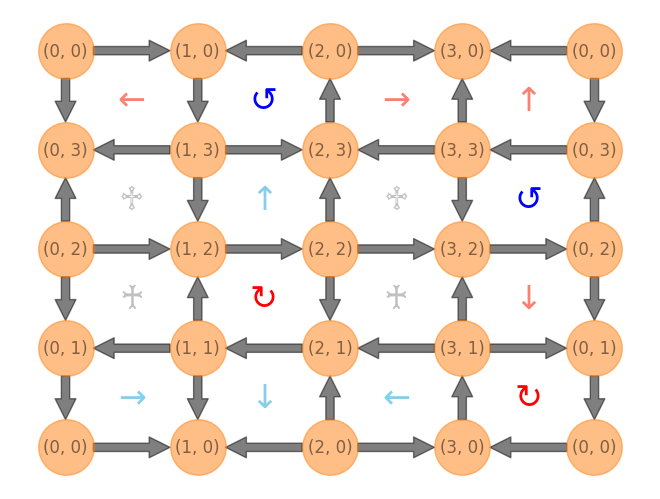

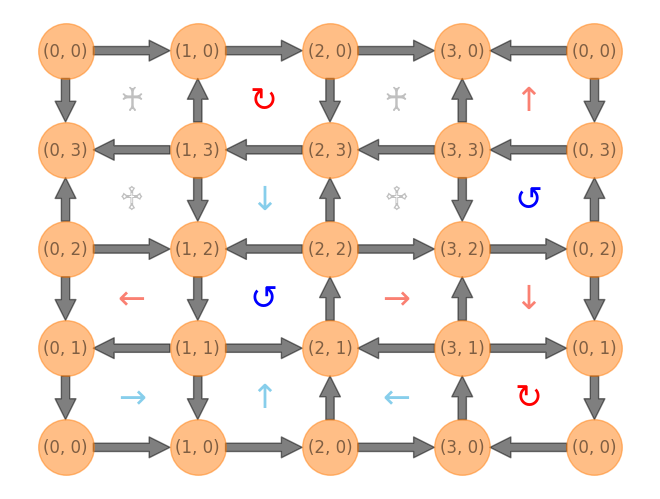

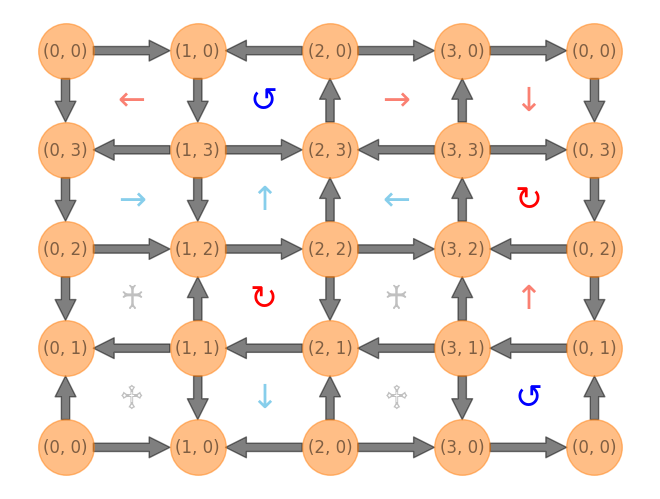

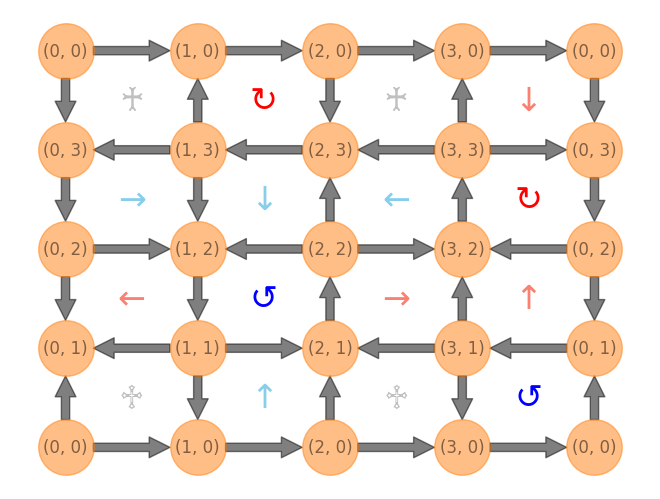

In [57]:
# {i: len(np.where(np.abs(evecs[:, i]) > 1e-12)[0]) for i in range(300)}

for i in np.where(np.abs(evecs[:, 51]) > 0.2)[0]:
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    # plt.figure(figsize=(10, 4), facecolor='white')
    g.plot()

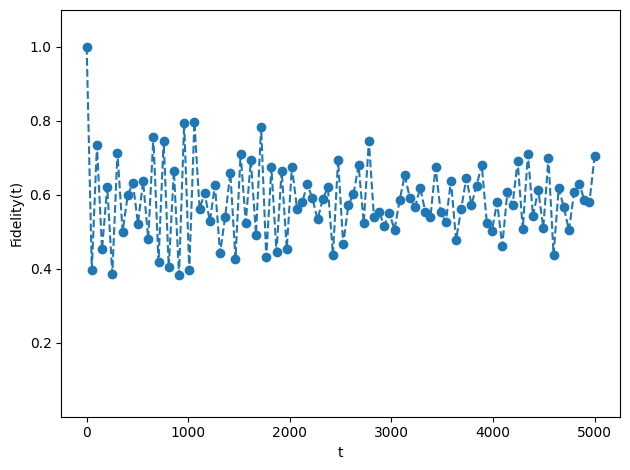

final fidelity = 0.7053538500152975
O_kin @ psi_scar = [-6.73272906e-16+1.11961322e-15j -1.69958714e-16+4.41404319e-16j
  1.93284909e-15-3.30919022e-15j -1.31749589e-15+2.31674566e-15j
  4.07117784e-15+6.89219069e-16j -4.06218019e-02+2.75167662e-02j
  4.17306829e-15+7.88675160e-16j -4.06218019e-02+2.75167662e-02j
 -6.90419943e-16+1.67097239e-15j  3.00391630e-02-7.41451850e-03j
  3.00391630e-02-7.41451850e-03j -1.77927588e-02+3.37588170e-02j
  7.37749175e-02-8.52832222e-02j -4.55435561e-02+8.05456847e-02j
  8.00861747e-04+4.89493896e-03j  4.06218019e-02-2.75167662e-02j
  3.24425797e-15+2.73107238e-16j -3.00391630e-02+7.41451850e-03j
 -6.48786580e-16-1.47451495e-16j -4.14598911e-16+3.24436658e-15j
  8.65720828e-03+1.91313497e-02j -3.92051014e-02+3.71702569e-02j
  2.98898800e-02+1.56198578e-02j -6.99633867e-03-1.57350253e-02j
  1.62911285e-15-1.66027434e-16j -3.85430028e-15+1.60258815e-15j
  1.61777482e-15-7.21381034e-16j  1.99373525e-15-1.21295019e-15j
  8.58790946e-16+6.81452811e-16j  2

In [67]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[5] = 1.5
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([34, 65, 86, 124]), 0] = np.array([1, -1, -1, 1])
scar_state /= np.linalg.norm(scar_state)

evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=0, stop=5000, num=100)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]

plt.plot(np.linspace(0, 5000, 100), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 6x2

In [85]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(6, 2), n_solution=76, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-09 12:30:52 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-09 12:30:52 [deep_first_search.py] INFO: Found 76 Solutions as required in 693 steps.


In [86]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
(0) 4475835,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(1) 4496307,0,1,0,0,0,1,0,0,1,0,...,1,1,1,0,1,1,0,0,1,1
(2) 4508598,0,1,0,0,0,1,0,0,1,1,...,1,1,1,0,1,1,0,1,1,0
(3) 4774695,0,1,0,0,1,0,0,0,1,1,...,1,1,0,0,1,0,0,1,1,1
(4) 4803387,0,1,0,0,1,0,0,1,0,1,...,1,1,0,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(71) 15524133,1,1,1,0,1,1,0,0,1,1,...,0,1,0,0,1,0,0,1,0,1
(72) 15566130,1,1,1,0,1,1,0,1,1,0,...,0,1,0,0,1,1,0,0,1,0
(73) 15573297,1,1,1,0,1,1,0,1,1,0,...,0,1,0,0,1,1,0,0,0,1
(74) 15648018,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,1,0


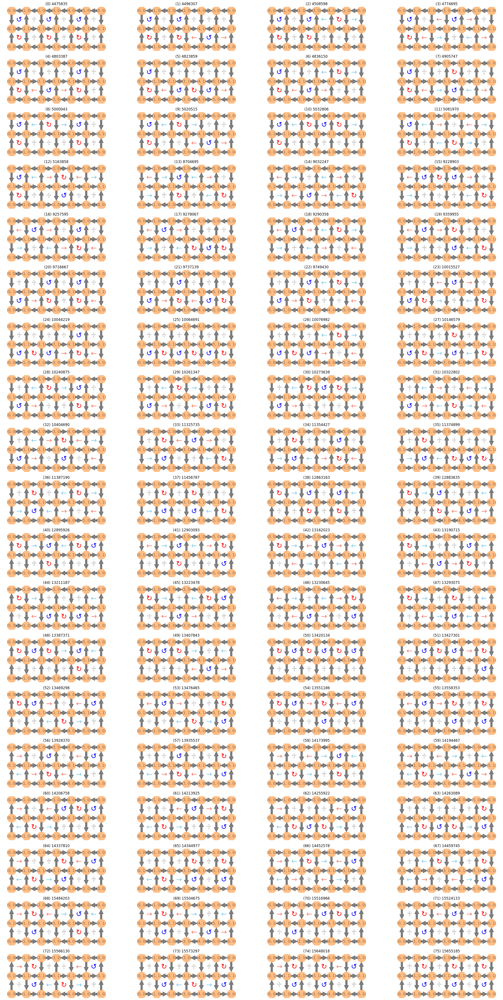

In [6]:
fig, axes = plt.subplots(19, 4, figsize=(30, 60), facecolor="white")
ax = axes.flatten()

for i in range(basis.n_states):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[i]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[i]}")

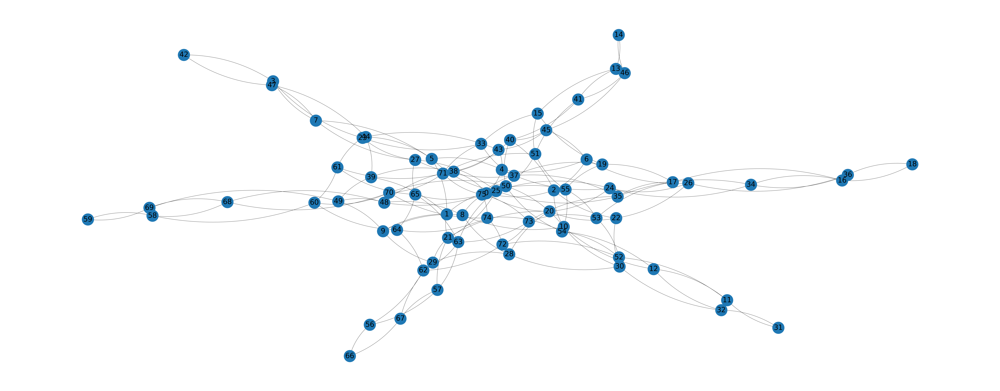

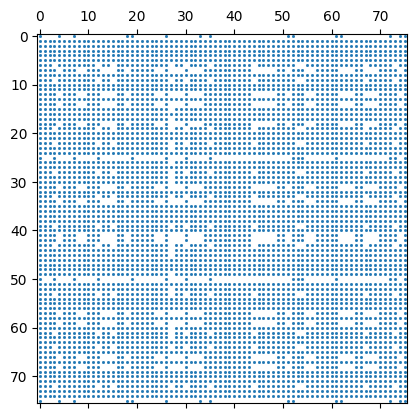

In [7]:
g = nx.from_numpy_array(-model.kinetic_term)
left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.03, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=1)
plt.show()

In [121]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df.loc[(entropy_df.index >= 20) & (entropy_df.index <= 50) & (entropy_df < 1.75)]

20    1.058436
21    1.059513
22    1.061746
23    1.054004
24    1.074146
25    1.075756
26    1.012101
27    1.045869
28    1.041082
29    1.036557
30    0.997521
31    1.003358
32    1.054331
33    1.045045
34    1.032524
35    1.043826
36    1.053413
37    1.049003
38    1.061464
39    1.071072
40    1.050495
41    1.034524
42    1.093099
43    1.087584
44    0.949660
45    1.050145
46    1.028086
47    1.045876
48    1.041796
49    1.025918
50    1.020980
Name: entropy, dtype: float64

<Axes: >

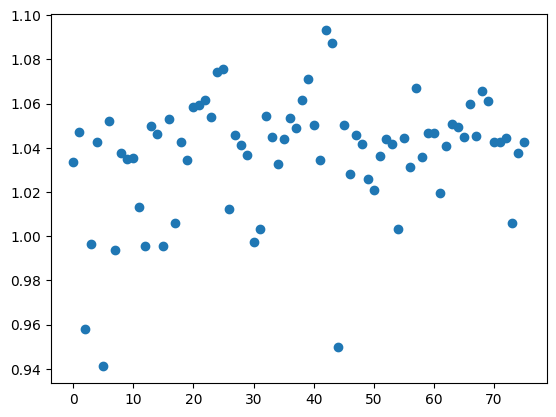

In [122]:
entropy_df.plot(style='o')

array([15, 17, 23, 26, 29, 30, 44, 45, 49, 52, 60, 62])

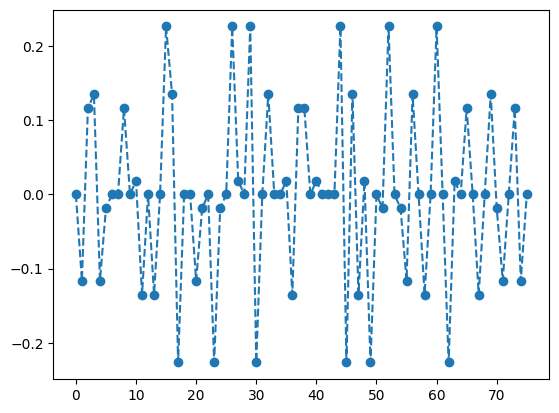

In [120]:
plt.plot(evecs[:, 44], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 44]) > 0.15)[0]

In [119]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df.iloc[44]

eval    4.678363
kin     0.730499
pot     3.947864
Name: 44, dtype: float64

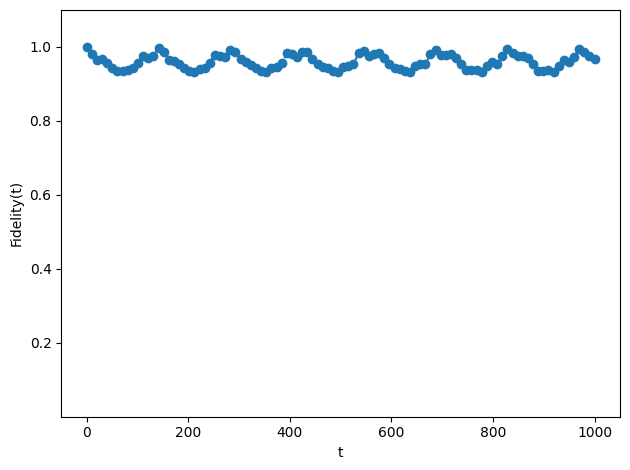

final fidelity = 0.9684200052672003
O_kin @ psi_scar = [ 4.74315894e-03-0.01351011j  1.03124779e-02+0.0318116j
 -7.33306781e-03-0.03792991j  1.52997953e-02+0.18422271j
  1.03124779e-02+0.0318116j   5.65523991e-03-0.00780859j
 -2.38554269e-03+0.01385663j -3.13183015e-03+0.0050453j
 -7.33306781e-03-0.03792991j -2.38554269e-03+0.01385663j
 -8.56180912e-03-0.00084907j -1.06443298e-02-0.21186007j
  3.77536184e-03+0.01009899j -6.65967834e-02-0.23316644j
  4.68541366e-03+0.00990252j  4.80413953e-02+0.15468343j
  8.00044595e-02+0.21580224j -5.40763198e-02-0.1522819j
 -1.46383257e-02-0.00309953j  2.79780403e-03-0.00045922j
  8.00265490e-03+0.03862601j -4.03437097e-03+0.01099935j
 -8.74394704e-03+0.02450193j -6.58516552e-03-0.12468163j
 -4.03437097e-03+0.01099935j -5.63272425e-04+0.00214595j
  4.15657095e-02+0.13874161j -8.01670083e-03+0.00049375j
 -8.74394704e-03+0.02450193j  4.15657095e-02+0.13874161j
 -2.04103940e-02-0.15438129j -1.65784189e-02-0.00708621j
  4.32299982e-02+0.22165957j -1.0178

In [130]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[0] = 1.05
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

# scar_state = np.zeros((basis.n_states, 1))
# scar_state[np.array([30, 45, 49, 26, 29, 44, 15, 52, 60, 17, 23, 62]), 0] = np.array([-1, -1, -1, 1, 1, 1, 1, 1, 1, -1, -1, -1])  # based on 44
# scar_state[np.array([3, 11, 16, 32, 36, 47, 58, 69]), 0] = np.array([1, -1, -1, 1, 1, -1, 1, -1])  # based on 24
# scar_state /= np.linalg.norm(scar_state)
scar_state = evecs[:, 44]

evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=0, stop=1000, num=100)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]

plt.plot(np.linspace(0, 1000, 100), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 6x4

In [131]:
coup_j, coup_rk = (1, 1)
basis, model = setup_model(lattice_shape=(6, 4), n_solution=1456, coup_j=coup_j, coup_rk=coup_rk)
evals, evecs = np.linalg.eigh(model.hamiltonian)

2023-12-09 12:47:54 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-09 12:48:04 [deep_first_search.py] INFO: Found 1456 Solutions as required in 27921 steps.


In [132]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,38,39,40,41,42,43,44,45,46,47
(0) 75046264433595,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(1) 75046599846843,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(2) 75051631045563,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(3) 75051966458811,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
(4) 75053308111803,0,1,0,0,0,1,0,0,0,1,...,1,1,1,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(1451) 262694465618193,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1452) 262694801031441,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1453) 262694884884753,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1
(1454) 262696142684433,1,1,1,0,1,1,1,0,1,1,...,0,1,0,0,0,1,0,0,0,1


In [140]:
evecs_df = pd.DataFrame.from_dict(
    {
        "eval": evals, 
        "kin": [(evec.T @ model.kinetic_term @ evec).item() for evec in evecs.T],
        "pot": [(evec.T @ model.potential_term @ evec).item() for evec in evecs.T],
    }
)
evecs_df.iloc[254]  #[evecs_df["kin"].abs() < 1e-4]

eval    4.000000
kin    -0.071014
pot     4.071014
Name: 254, dtype: float64

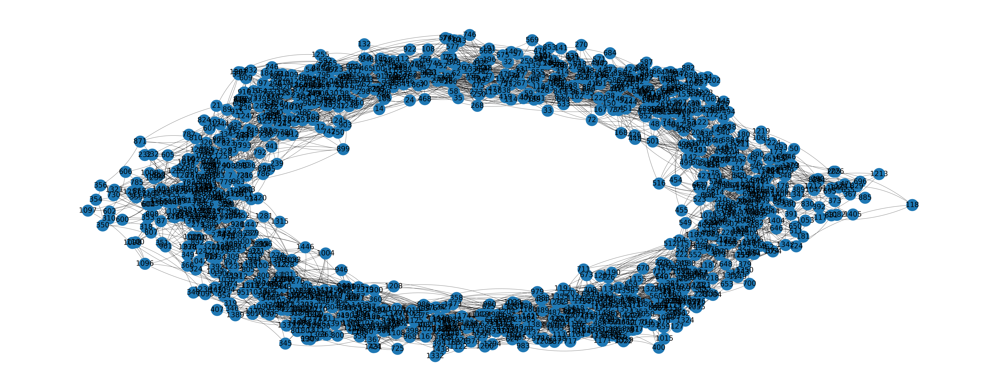

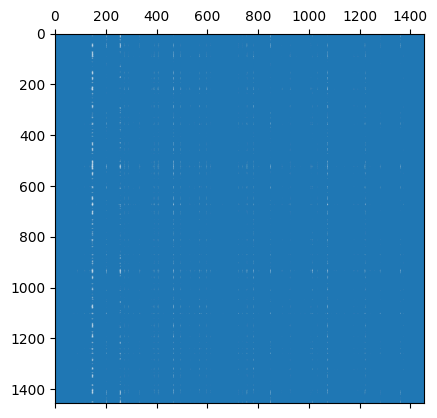

In [149]:
g = nx.from_numpy_array(-model.kinetic_term)
left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
pos = {k: v + np.random.normal(0, 0.08, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()

In [136]:
entropies = np.asarray([model.entropy(evecs[:, i], 0, 0) for i in range(basis.n_states)])
entropy_df = pd.Series(entropies, name="entropy")
entropy_df[entropy_df < 1.6]

254     0.768489
1219    1.511229
Name: entropy, dtype: float64

<Axes: >

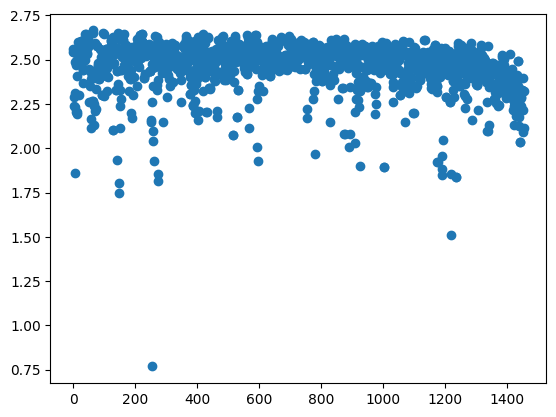

In [137]:
entropy_df.plot(style='o')

array([ 367,  390,  655,  695, 1099, 1102, 1239, 1256])

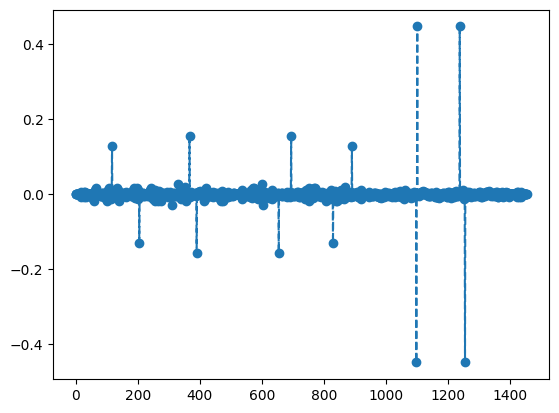

In [139]:
plt.plot(evecs[:, 254], linestyle='--', marker='o')
np.where(np.abs(evecs[:, 254]) > 0.15)[0]

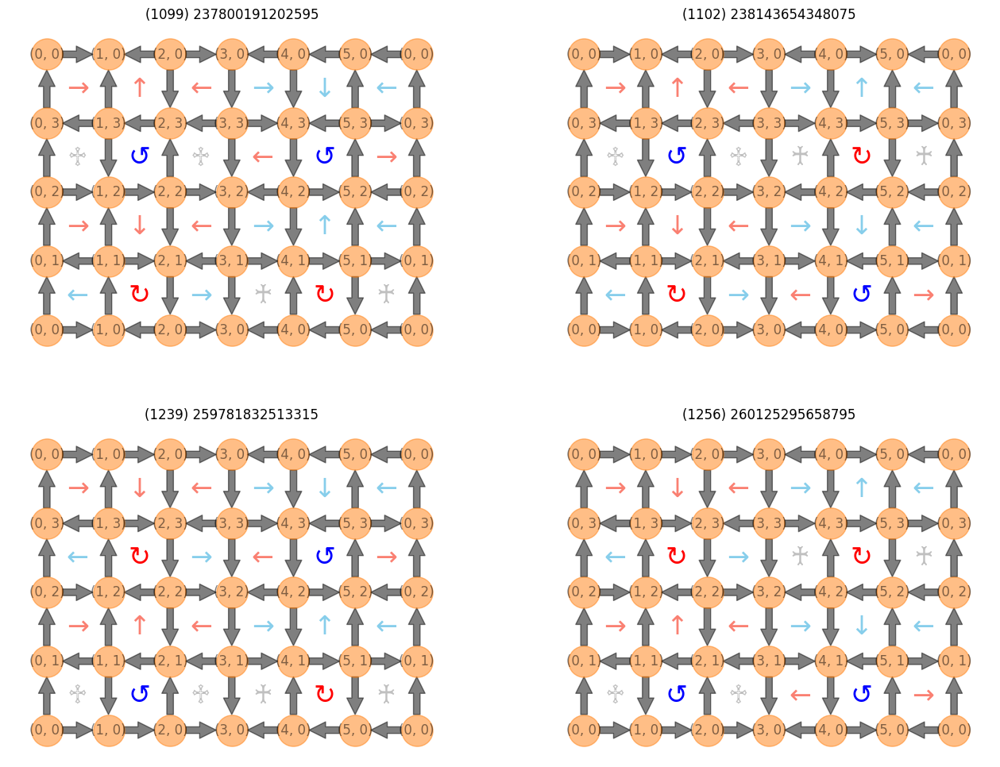

In [143]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12), facecolor="white")
ax = axes.flatten()

for i, val in enumerate([1099, 1102, 1239, 1256]):
    g = GraphVisualizer(SquareLattice(*model.shape, basis.dataframe.iloc[val]))
    g.plot(show=False, ax=ax[i], node_size=800)
    ax[i].set_title(f"{df.index[val]}")

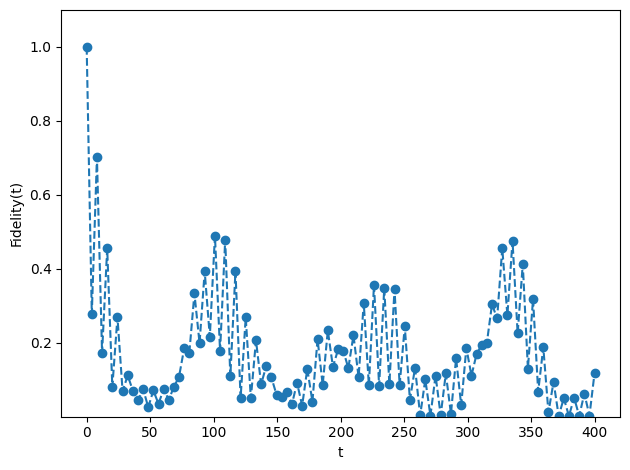

final fidelity = 0.11950576091471703
O_kin @ psi_scar = [-0.05437598+0.02079592j  0.01736323+0.01409695j -0.04329677+0.01510783j
 ... -0.04294009-0.0047656j  -0.03081282+0.03101212j
 -0.05437598+0.02079592j]
<O_kin> = (-0.20564003238744755-0.11039706866618174j)
<O_pot> = (0.8861749223952038+0.21646382074602477j)
<H> = (0.680534890007755+0.10606675207984309j)


In [148]:
coup_j = np.ones((np.prod(model.shape), 1))
coup_j[1] = 1.5
energy_lump_model = QuantumLinkModel(coup_j, coup_rk, model.shape, basis)
energy_lump_ham = energy_lump_model.hamiltonian

scar_state = np.zeros((basis.n_states, 1))
scar_state[np.array([1099, 1102, 1239, 1256]), 0] = np.array([1, -1, -1, 1])
scar_state /= np.linalg.norm(scar_state)

evol_states = expm_multiply(-1j * energy_lump_ham, scar_state, start=0, stop=400, num=100)
fidelity = [np.abs(evol_state.T @ scar_state).item() ** 2 for evol_state in evol_states]

plt.plot(np.linspace(0, 400, 100), fidelity, linestyle="--", marker="o")
plt.ylim(0.0001, 1.1)
# plt.yscale('log')
plt.xlabel("t")
plt.ylabel("Fidelity(t)")
plt.tight_layout()
plt.show()

final_state = np.real_if_close(evol_states[-1], tol=1e-12)
print(f"final fidelity = {fidelity[-1]}")
print(f"O_kin @ psi_scar = {(model.kinetic_term @ final_state).flatten()}")
print(f"<O_kin> = {(final_state.T @ model.kinetic_term @ final_state).item()}")
print(f"<O_pot> = {(final_state.T @ model.potential_term @ final_state).item()}")
print(f"<H> = {(final_state.T @ model.hamiltonian @ final_state).item()}")

# Lattice 8x4

In [ ]:
coup_j, coup_rk = (1, 1)
gauss_law = GaussLaw.from_staggered_charge_distri(8, 4)
gauss_law.flux_sector = (0, 0)
dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+8))
basis = gauss_law.to_basis(dfs.solve(n_solution=17412))
model = QuantumLinkModel(coup_j, coup_rk, (8, 4), basis)

In [ ]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

In [ ]:
g = nx.from_numpy_array(-model.kinetic_term)
left, right = nx.bipartite.sets(g)
# pos = nx.bipartite_layout(g, left, align='horizontal')
pos = nx.spectral_layout(g)
# pos = {k: v + np.random.normal(0, 0.08, 2) for k, v in pos.items()}
fig = plt.figure(figsize=(82, 32))
nx.draw(g, pos, with_labels=True, node_size=5000, font_size=42, arrows=True, connectionstyle="arc3,rad=0.15")
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.05)
plt.show()